# Generative Adversarial Networks

<img src="GAN.JPG">

## Download MNIST and load it

In [1]:
import os
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import shutil

from tensorflow.keras.datasets.cifar10 import load_data
(train_data, train_label), (test_data, test_label) = load_data()
train_data = train_data / 255.
test_data = test_data / 255.

def img_tile(imgs, aspect_ratio=1.0, tile_shape=None, border=1,
             border_color=0):
    ''' Tile images in a grid.
    If tile_shape is provided only as many images as specified in tile_shape
    will be included in the output.
    '''
    imgs = np.array(imgs)
    if imgs.ndim != 3 and imgs.ndim != 4:
        raise ValueError('imgs has wrong number of dimensions.')
    n_imgs = imgs.shape[0]

    # Grid shape
    img_shape = np.array(imgs.shape[1:3])
    if tile_shape is None:
        img_aspect_ratio = img_shape[1] / float(img_shape[0])
        aspect_ratio *= img_aspect_ratio
        tile_height = int(np.ceil(np.sqrt(n_imgs * aspect_ratio)))
        tile_width = int(np.ceil(np.sqrt(n_imgs / aspect_ratio)))
        grid_shape = np.array((tile_height, tile_width))
    else:
        assert len(tile_shape) == 2
        grid_shape = np.array(tile_shape)

    # Tile image shape
    tile_img_shape = np.array(imgs.shape[1:])
    tile_img_shape[:2] = (img_shape[:2] + border) * grid_shape[:2] - border

    # Assemble tile image
    tile_img = np.empty(tile_img_shape)
    tile_img[:] = border_color
    for i in range(grid_shape[0]):
        for j in range(grid_shape[1]):
            img_idx = j + i * grid_shape[1]
            if img_idx >= n_imgs:
                # No more images - stop filling out the grid.
                break
            img = imgs[img_idx]
            yoff = (img_shape[0] + border) * i
            xoff = (img_shape[1] + border) * j
            tile_img[yoff:yoff + img_shape[0], xoff:xoff + img_shape[1], ...] = img

    return tile_img


def plot_network_output(data, reconst_data, generated, step):
    num = 8
    
    fig, ax = plt.subplots(nrows=3, ncols=num, figsize=(18, 6))
    for i in xrange(num):
        ax[(0, i)].imshow(np.squeeze(generated[i]), cmap=plt.cm.gray)
        ax[(1, i)].imshow(np.squeeze(data[i]), cmap=plt.cm.gray)
        ax[(2, i)].imshow(np.squeeze(reconst_data[i]), cmap=plt.cm.gray)
        ax[(0, i)].axis('off')
        ax[(1, i)].axis('off')
        ax[(2, i)].axis('off')

    fig.suptitle('Top: generated | Middle: data | Bottom: recunstructed')
#     plt.show()
    plt.savefig(IMAGE_DIR + '/{}.png'.format(str(step).zfill(6)))
    plt.close()

## show MNIST

In [2]:
# size of MNIST
print(train_data.shape)
print(train_label.shape)
print(test_data.shape)
print(test_label.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


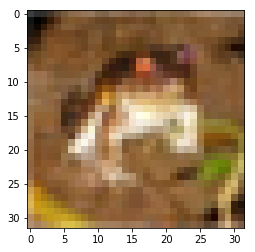

In [3]:
plt.imshow(train_data[0], 'gray')

## Delete summary folder and make it

## Define tensorflow graph

In [4]:
SUMMARY_DIR = './gan_summary'
TRAIN_DIR = SUMMARY_DIR + '/train'
TEST_DIR = SUMMARY_DIR + '/test'
IMAGE_DIR = SUMMARY_DIR + '/image'

if os.path.exists(SUMMARY_DIR):
    shutil.rmtree(SUMMARY_DIR)
if not os.path.exists(SUMMARY_DIR):
    os.makedirs(SUMMARY_DIR)
    os.makedirs(TRAIN_DIR)
    os.makedirs(TEST_DIR)
    os.makedirs(IMAGE_DIR)

In [5]:
def fully_connected(inputs, out_channel, name='fc'):
    """
    very simple fully connected layer function

    Args:
        inputs: a batch of input tensor [batch_size, n]
                where n is the number of input feature dimension
        out_channel: output channel dimension

    Returns:
        fc: inputs * weights + biases [batch_size, out_channel]
    """
    # in_channel: input channel dimension
    # w_shape: shape of weight matrix
    # b_shape: shape of bias vector
    in_channel = inputs.get_shape().as_list()[1]
    w_shape = [in_channel, out_channel]
    b_shape = [out_channel]

    # Define weight matrix variable, bias vector variable
    with tf.variable_scope(name):
        # To share the variables you have to use
        # a function 'tf.get_variable' instead of 'tf.Variable'
        weights = tf.get_variable('weights', shape=w_shape,
                                  initializer=tf.truncated_normal_initializer(stddev=0.02))
        biases = tf.get_variable('biases', shape=b_shape,
                                 initializer=tf.constant_initializer(0.0))

        fc = tf.matmul(inputs, weights)
        fc = tf.nn.bias_add(fc, biases)

        return fc


def discriminator(x, reuse=None):
    """
    build the discriminator

    Args:
        x: a batch of input to the network [batch_size, 28, 28, 3]

    returns:
        net: output of the discriminator [batch_size, 1]
    """
    with tf.variable_scope('discriminator') as scope:
        if reuse:
            scope.reuse_variables()

        # Vectorize the input x
        # Fully connected layer with 256 output units and 'fc1' as its name
        # Apply non-linearity function 'relu'
        # Fully connected layer with 1 output units and 'fc2' as its name
        # Apply non-linearity function 'sigmoid'
        # Return the final tensor
        net = tf.reshape(x, [batch_size, 32*32*3])
        net = fully_connected(net, 256, name='fc1')
        net = tf.nn.relu(net)
        net = fully_connected(net, 1, name='fc2')
        net = tf.nn.sigmoid(net)
        return net


def generator(z):
    """
    build the generator

    Args:
        z: a batch of input to the network [batch_size, z_dim]

    Returns:
        net: output of the generator [batch_size, 32, 32, 3]
    """
    with tf.variable_scope('generator') as scope:

        # Unlike the discriminator, input z is a set of vectors
        
        # Fully connected layer with 256 output units and 'fc1' as its name
        # Apply non-linearity function 'relu'
        # Fully connected layer with 784 output units and 'fc2' as its name
        # Apply non-linearity function 'sigmoid'
        # Reshape final output to be a proper image file [32, 32, 3]
        # Return the final tensor
        net = fully_connected(z, 256, name='fc1')
        net = tf.nn.relu(net)
        net = fully_connected(net, 32*32*3, name='fc2')
        net = tf.nn.sigmoid(net)
        net = tf.reshape(net, [z.get_shape().as_list()[0], 32, 32, 3])
        return net


def get_loss(D_real, D_fake, eps=1e-10):
    """
    get loss of GAN

    Args:
        D_real: Real Discriminator output [batch_size, 1]
        D_rake: Fake discriminator output [batch_size, 1]

    Returns:
        D_loss: Discriminator loss
        G_loss: Generator loss
    """
    D_loss = -(tf.reduce_mean(tf.log(D_real + eps)) + tf.reduce_mean(tf.log(1 - D_fake + eps)))
    G_loss = -tf.reduce_mean(tf.log(D_fake + eps))

    return D_loss, G_loss


def get_next_batch(data, label, batch_size):
    """
    get 'batch_size' amount of data and label randomly

    Args:
        data: data
        label: label
        batch_size: # of data to get

    Returns:
        batch_data: data of 'batch_size'
        batch_label: coresponding label of batch_data
    """
    n_data = data.shape[0]
    random_idx = random.sample(range(1, n_data), batch_size)

    batch_data = data[random_idx]
    batch_label = label[random_idx]
    return batch_data, batch_label


# Set hyperparameters
batch_size = 100
z_dim = 128
max_step = 20000
lr = 0.001
beta1 = 0.9

# train_data = np.expand_dims(train_data, 3)
# test_data = np.expand_dims(test_data, 3)

############################# Build the model #############################
# Define image tensor x placeholder
x = tf.placeholder(tf.float32, [batch_size, 32, 32, 3], name='input_x')
# Define z vector as uniform distribution between [-1, 1]
z = tf.random_uniform((batch_size, z_dim), -1., 1., name='latent_z')

# Build discriminator where input data is real image x
D_real = discriminator(x, reuse=False)
# Build generator
G = generator(z)
# Build discriminator where input data is generated image G
D_fake = discriminator(G, reuse=True)

# Get D_loss and G_loss
D_loss, G_loss = get_loss(D_real, D_fake)

# Make optimization op
opt = tf.train.AdamOptimizer(lr, beta1=beta1)

# To update the generator and the discriminator
# get their network parameters
G_params = [param for param in tf.trainable_variables()
            if 'generator' in param.name]
D_params = [param for param in tf.trainable_variables()
            if 'discriminator' in param.name]

# Make train op for each network
D_train = opt.minimize(D_loss, var_list=D_params)
G_train = opt.minimize(G_loss, var_list=G_params)

# Make initialization op
init = tf.global_variables_initializer()

# Add summary and make op to add summary data to event log
tf.summary.scalar('Generator_loss', G_loss)
tf.summary.scalar('Discriminator_loss', D_loss)
merged = tf.summary.merge_all()

## Train GAN

Training data


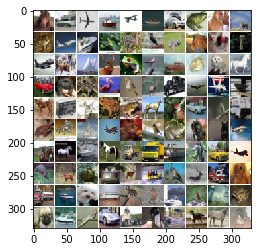

0 steps |  G_loss: 1.4001, D_loss: 1.4011


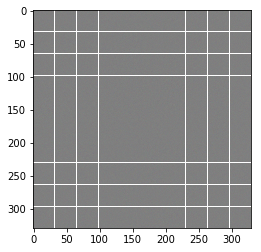

200 steps |  G_loss: 1.8943, D_loss: 0.4356


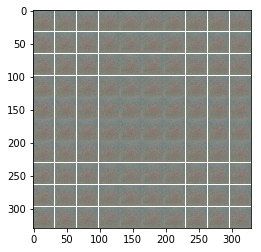

400 steps |  G_loss: 16.1094, D_loss: 1.0516


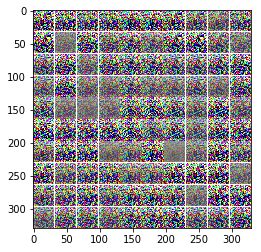

600 steps |  G_loss: 16.3306, D_loss: 0.0621


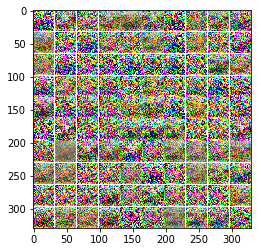

800 steps |  G_loss: 7.8706, D_loss: 0.0836


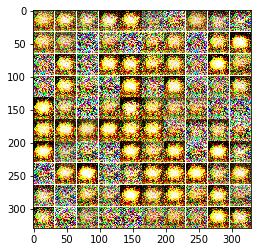

1000 steps |  G_loss: 6.7518, D_loss: 0.3289


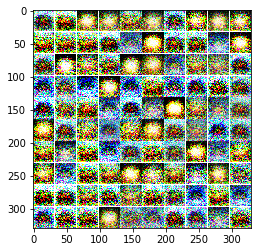

1200 steps |  G_loss: 9.0039, D_loss: 0.2365


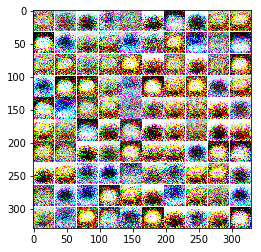

1400 steps |  G_loss: 8.4600, D_loss: 0.3190


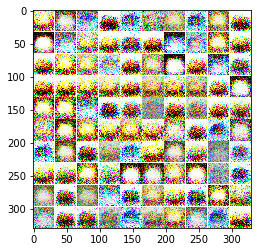

1600 steps |  G_loss: 6.0892, D_loss: 0.1508


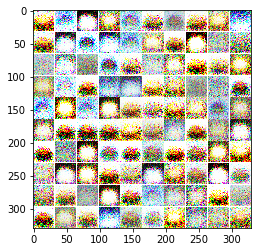

1800 steps |  G_loss: 3.7925, D_loss: 0.3356


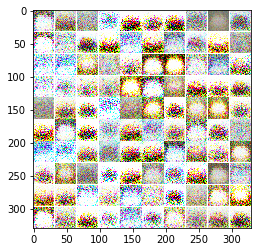

2000 steps |  G_loss: 6.1393, D_loss: 0.1213


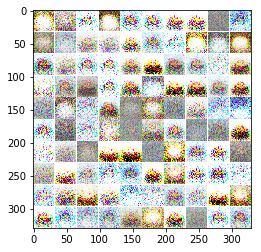

2200 steps |  G_loss: 7.6244, D_loss: 0.2647


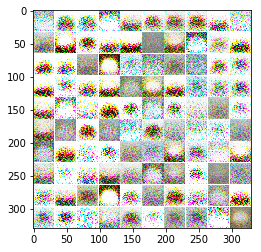

2400 steps |  G_loss: 5.4469, D_loss: 0.1407


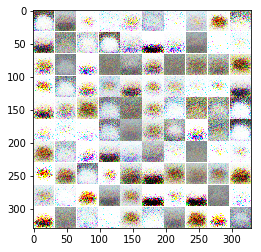

2600 steps |  G_loss: 3.9444, D_loss: 0.3083


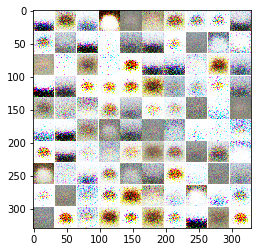

2800 steps |  G_loss: 6.9225, D_loss: 0.3166


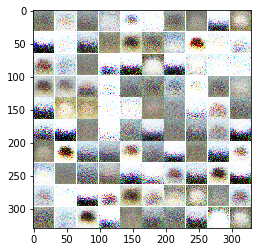

3000 steps |  G_loss: 9.8845, D_loss: 0.7875


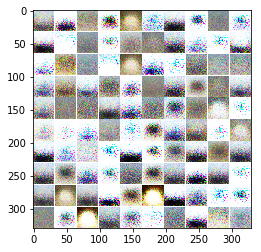

3200 steps |  G_loss: 5.5880, D_loss: 0.3572


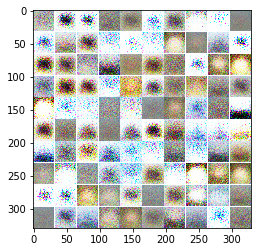

3400 steps |  G_loss: 8.1595, D_loss: 0.4154


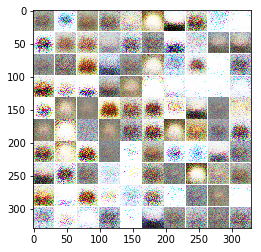

3600 steps |  G_loss: 7.3047, D_loss: 0.7129


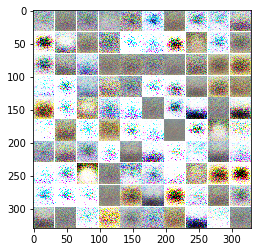

3800 steps |  G_loss: 4.0151, D_loss: 0.7366


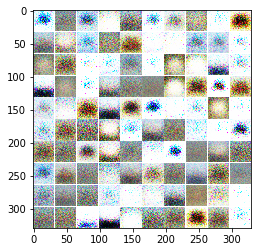

4000 steps |  G_loss: 4.1621, D_loss: 0.7826


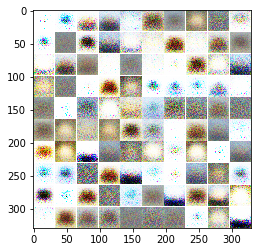

4200 steps |  G_loss: 3.7651, D_loss: 1.9327


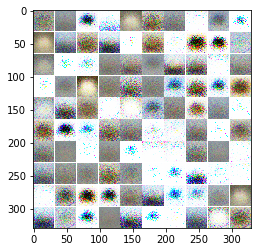

4400 steps |  G_loss: 2.9265, D_loss: 0.5402


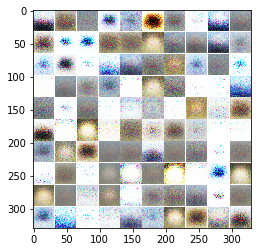

4600 steps |  G_loss: 3.1279, D_loss: 1.7200


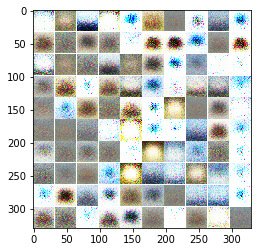

4800 steps |  G_loss: 3.0797, D_loss: 1.2925


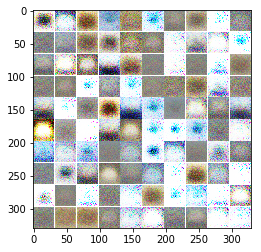

5000 steps |  G_loss: 4.8947, D_loss: 2.1409


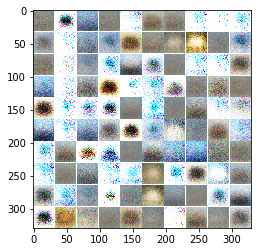

5200 steps |  G_loss: 3.1032, D_loss: 2.0531


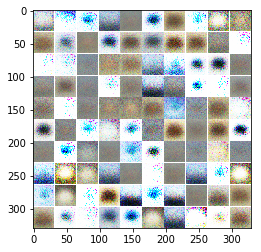

5400 steps |  G_loss: 3.5380, D_loss: 1.4539


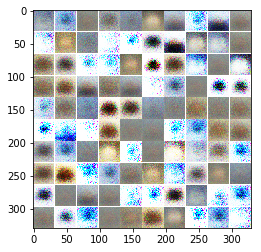

5600 steps |  G_loss: 2.9167, D_loss: 0.6454


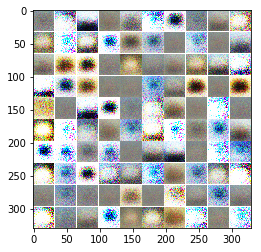

5800 steps |  G_loss: 2.9680, D_loss: 0.7854


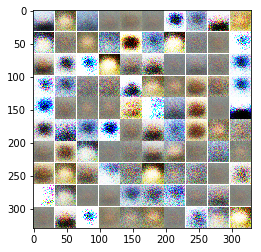

6000 steps |  G_loss: 2.2606, D_loss: 1.4791


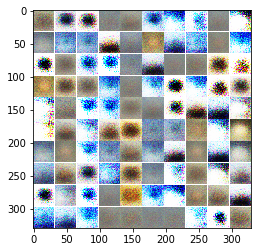

6200 steps |  G_loss: 1.6381, D_loss: 1.3510


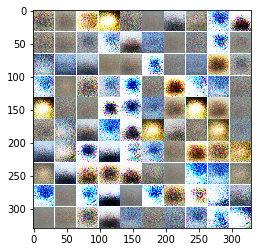

6400 steps |  G_loss: 5.0216, D_loss: 0.4942


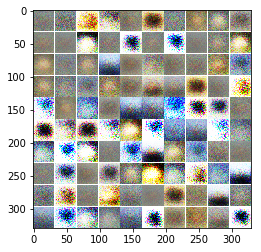

6600 steps |  G_loss: 3.1147, D_loss: 0.7263


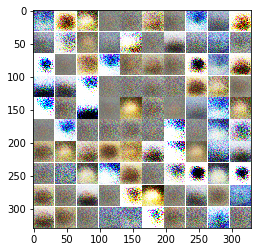

6800 steps |  G_loss: 3.2621, D_loss: 2.4357


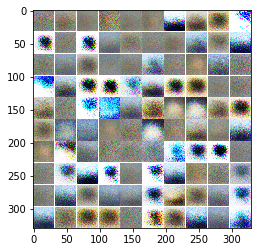

7000 steps |  G_loss: 4.4072, D_loss: 2.0921


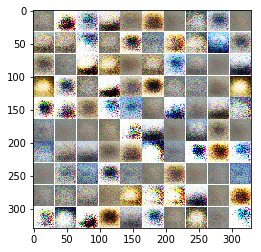

7200 steps |  G_loss: 3.3571, D_loss: 1.7609


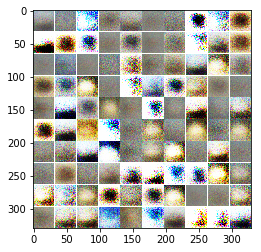

7400 steps |  G_loss: 2.1307, D_loss: 1.2394


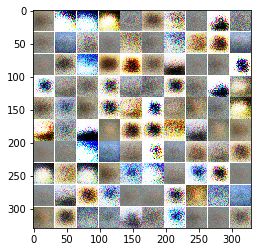

7600 steps |  G_loss: 2.9949, D_loss: 2.1069


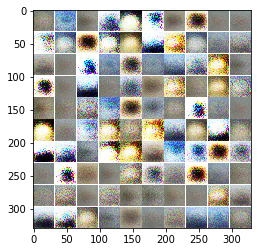

7800 steps |  G_loss: 6.2179, D_loss: 0.9118


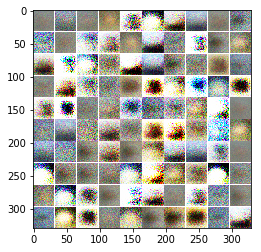

8000 steps |  G_loss: 2.6760, D_loss: 1.2713


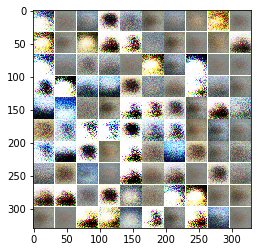

8200 steps |  G_loss: 4.1009, D_loss: 0.9855


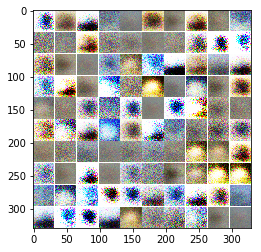

8400 steps |  G_loss: 2.3080, D_loss: 1.1744


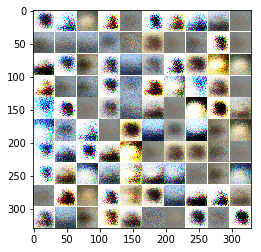

8600 steps |  G_loss: 3.8254, D_loss: 1.2425


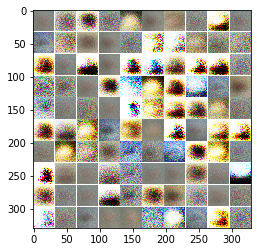

8800 steps |  G_loss: 4.2614, D_loss: 0.9921


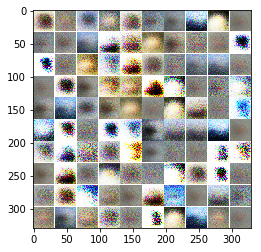

9000 steps |  G_loss: 3.3863, D_loss: 0.8909


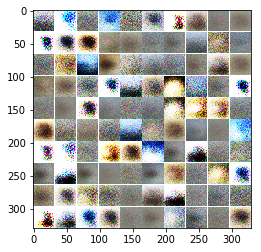

9200 steps |  G_loss: 2.3323, D_loss: 0.8680


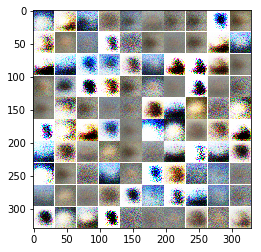

9400 steps |  G_loss: 2.8701, D_loss: 0.7966


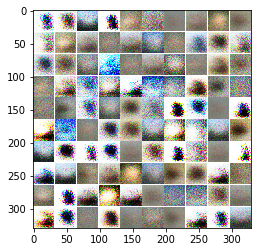

9600 steps |  G_loss: 3.1445, D_loss: 0.9702


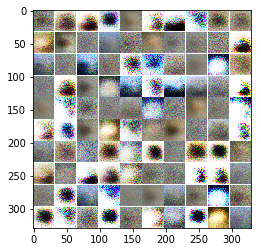

9800 steps |  G_loss: 1.7229, D_loss: 1.5057


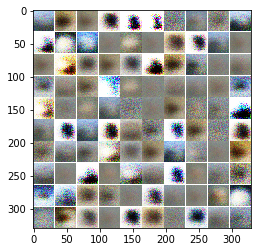

10000 steps |  G_loss: 2.6541, D_loss: 1.0911


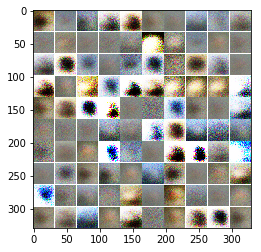

10200 steps |  G_loss: 1.8173, D_loss: 1.5306


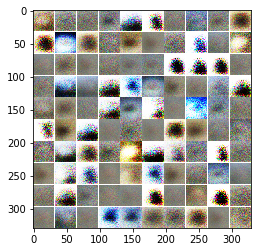

10400 steps |  G_loss: 2.9095, D_loss: 1.4048


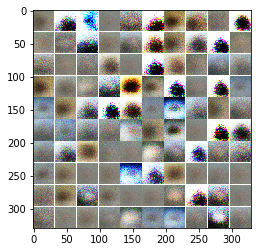

10600 steps |  G_loss: 2.6437, D_loss: 1.2246


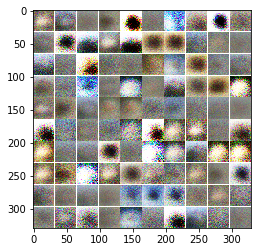

10800 steps |  G_loss: 2.5625, D_loss: 1.0076


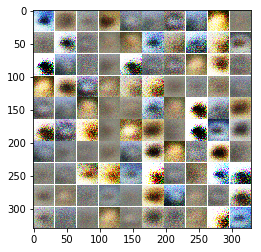

11000 steps |  G_loss: 2.4954, D_loss: 0.6930


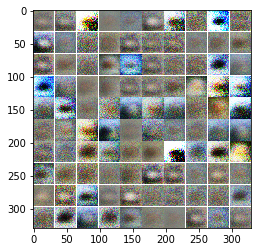

11200 steps |  G_loss: 1.1585, D_loss: 0.7729


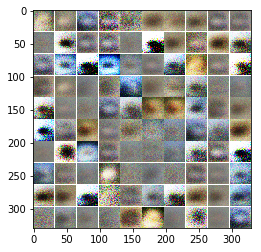

11400 steps |  G_loss: 1.9572, D_loss: 0.7537


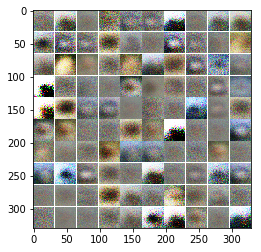

11600 steps |  G_loss: 1.7968, D_loss: 1.2718


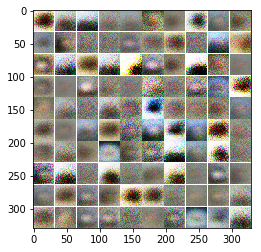

11800 steps |  G_loss: 0.9193, D_loss: 1.7877


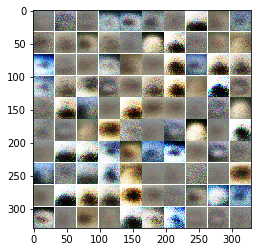

12000 steps |  G_loss: 1.9469, D_loss: 0.9471


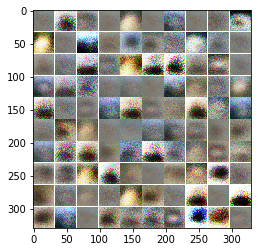

12200 steps |  G_loss: 1.1006, D_loss: 1.7433


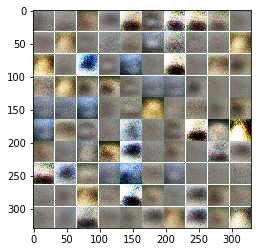

12400 steps |  G_loss: 4.5236, D_loss: 0.4407


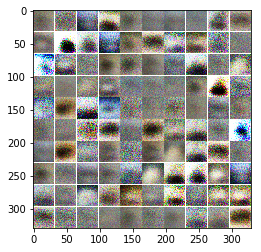

12600 steps |  G_loss: 1.0876, D_loss: 1.2375


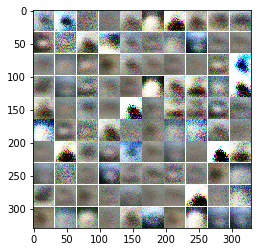

12800 steps |  G_loss: 5.0500, D_loss: 0.4861


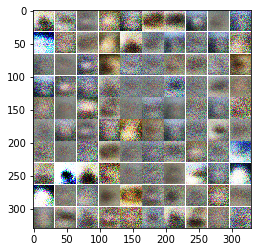

13000 steps |  G_loss: 2.6821, D_loss: 1.4049


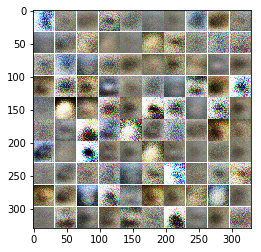

13200 steps |  G_loss: 4.1685, D_loss: 0.4963


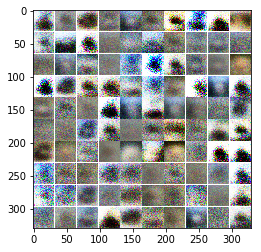

13400 steps |  G_loss: 1.3965, D_loss: 1.7586


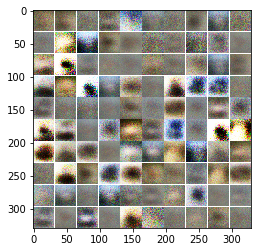

13600 steps |  G_loss: 1.3184, D_loss: 2.0627


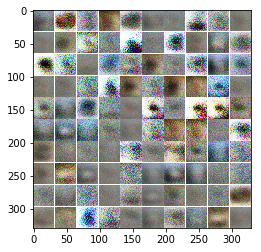

13800 steps |  G_loss: 1.3279, D_loss: 1.2461


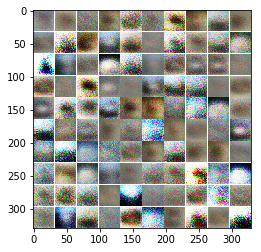

14000 steps |  G_loss: 1.4903, D_loss: 0.9874


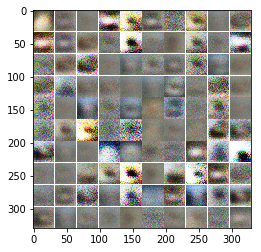

14200 steps |  G_loss: 3.4233, D_loss: 0.9637


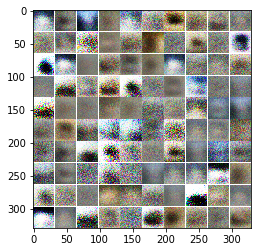

14400 steps |  G_loss: 3.9177, D_loss: 1.3230


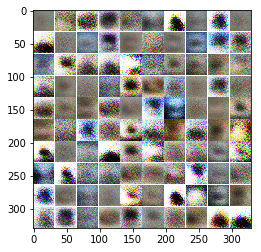

14600 steps |  G_loss: 3.6348, D_loss: 0.6710


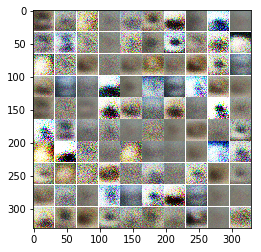

14800 steps |  G_loss: 2.1699, D_loss: 0.7983


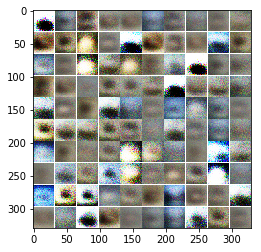

15000 steps |  G_loss: 1.1826, D_loss: 1.2741


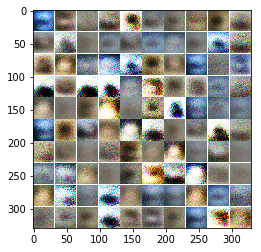

15200 steps |  G_loss: 1.0367, D_loss: 2.5850


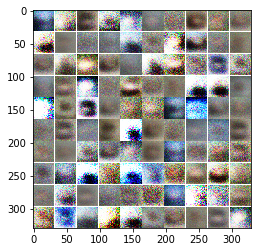

15400 steps |  G_loss: 2.5240, D_loss: 1.6051


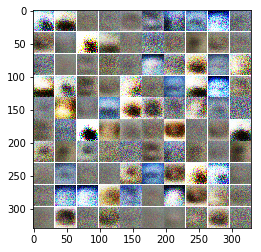

15600 steps |  G_loss: 0.9647, D_loss: 2.5937


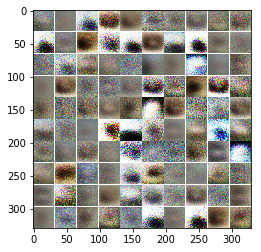

15800 steps |  G_loss: 0.9331, D_loss: 1.9820


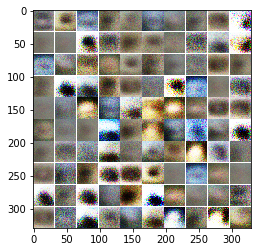

16000 steps |  G_loss: 1.3306, D_loss: 1.2025


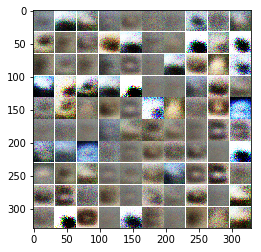

16200 steps |  G_loss: 1.7636, D_loss: 1.4115


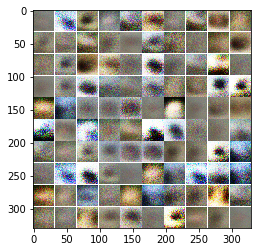

16400 steps |  G_loss: 2.0175, D_loss: 0.8765


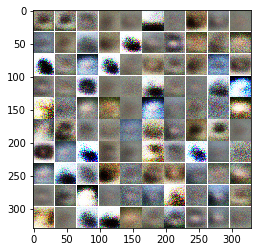

16600 steps |  G_loss: 0.8787, D_loss: 1.3112


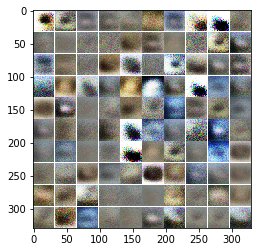

16800 steps |  G_loss: 0.8861, D_loss: 2.3457


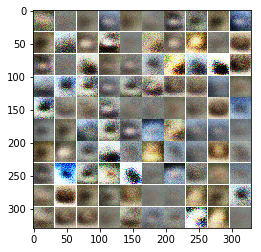

17000 steps |  G_loss: 1.2402, D_loss: 1.6734


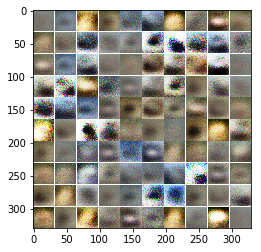

17200 steps |  G_loss: 1.7720, D_loss: 0.9918


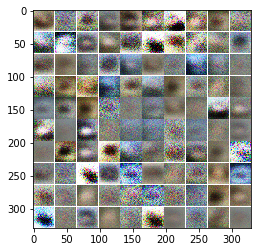

17400 steps |  G_loss: 1.3779, D_loss: 1.2696


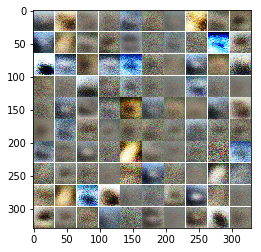

17600 steps |  G_loss: 2.4153, D_loss: 0.9435


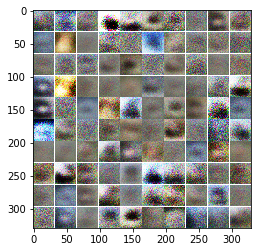

17800 steps |  G_loss: 1.1912, D_loss: 1.3483


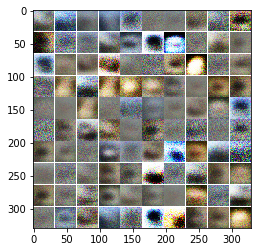

18000 steps |  G_loss: 0.7521, D_loss: 1.5375


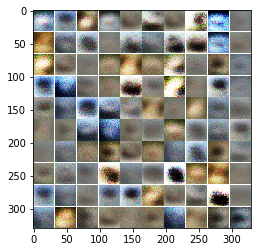

18200 steps |  G_loss: 0.9497, D_loss: 1.1541


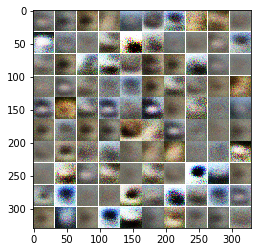

18400 steps |  G_loss: 1.2704, D_loss: 1.4290


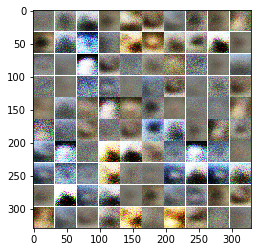

18600 steps |  G_loss: 0.9591, D_loss: 2.6902


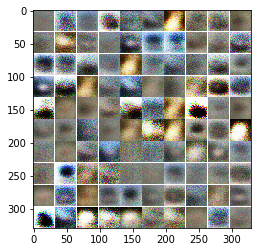

18800 steps |  G_loss: 1.9034, D_loss: 2.1564


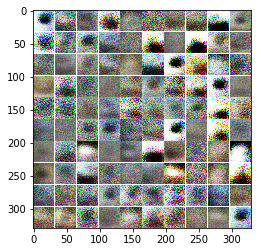

19000 steps |  G_loss: 1.0293, D_loss: 1.5349


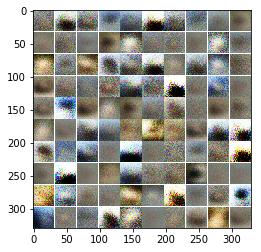

19200 steps |  G_loss: 1.0994, D_loss: 1.3270


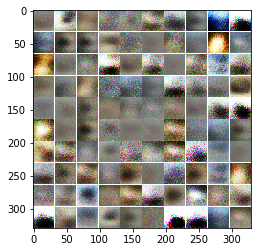

19400 steps |  G_loss: 0.9153, D_loss: 2.5388


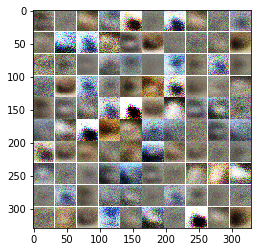

19600 steps |  G_loss: 1.5427, D_loss: 1.6552


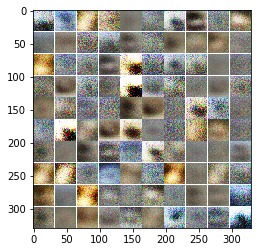

19800 steps |  G_loss: 1.5707, D_loss: 1.4802


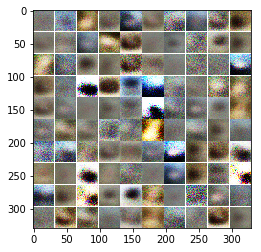

In [6]:
with tf.Session() as sess:
    # Define writer
    train_writer = tf.summary.FileWriter(TRAIN_DIR, sess.graph)
    test_writer = tf.summary.FileWriter(TEST_DIR)
    
    # Initialize variables
    sess.run(init)
    
    # Before train the model, shows train data and save it
    batch_x, batch_y = get_next_batch(train_data, train_label, batch_size)
    train_tiled = img_tile(batch_x, border_color=1.0)
    train_tiled = np.squeeze(train_tiled)
    print("Training data")
    plt.imshow(train_tiled, cmap=plt.cm.gray)
    plt.show()
    plt.imsave(IMAGE_DIR + '/train.png', train_tiled, cmap=plt.cm.gray)
    
    samples = []
    for step in range(max_step):
        batch_x, batch_y = get_next_batch(train_data, train_label, batch_size)
        
        _, d_loss = sess.run([D_train, D_loss], feed_dict={x: batch_x})
        _, g_loss = sess.run([G_train, G_loss])
        summary = sess.run(merged, feed_dict={x: batch_x})
        train_writer.add_summary(summary, step)
        
        # Save generarted data to make gif files
        if step % 50 == 0:
            g = sess.run(G)
            g_tiled = img_tile(g, border_color=1.0)
            g_tiled = np.squeeze(g_tiled)
            samples.append(g_tiled)
        if step % 200 == 0:
            print("{} steps |  G_loss: {:.4f}, D_loss: {:.4f}".format(step, g_loss, d_loss))
            plt.imshow(g_tiled, cmap=plt.cm.gray)
            plt.show()
            plt.imsave(IMAGE_DIR + '/{}.png'.format(str(step).zfill(6)),
                       g_tiled, cmap=plt.cm.gray)
#             plt.close()



In [7]:
import imageio
# Make gif files
imageio.mimsave(SUMMARY_DIR + '/generated.gif', samples)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0